#### **0)  Prerequisites (Notes):**


Refer to ```qa_aggregate.py``` and ```preload_aggregate.py``` for the extraction process of temporal aggregates by annual, monthly, weekday-weekend, and hourly intervals from 2023 September and 2024 August. The plots and maps in this notebook were made accordingly using the processed images from implementing the functions in ```preload.aggregate.py``` on Atlantic Canada and the Quebec City-Windsor corridor spatial extents.

Furthermore, in the ```/download/``` folder, refer to ```tempo.py``` and ```tropomi.py``` for getting Level 3 data and grid coordinate (Latitude/Longitude) arrays of TEMPO and TROPOMI respectively. Meanwhile, the locations of surface regulatory monitors were based on the outputs from ```airnow.py``` in the same folder. The Canadian census tract / dissemination area boundaries were used in city-level mapping, refer to ```census.py``` for details.

Below lists all the packages required for running this notebook.

In [ ]:
!pip install contextily
!pip install geoplot
!pip install rioxarray
!pip install basemap-data-hires
!pip install basemap
!pip install matplotlib_scalebar
!pip install exactextract

In [ ]:
import numpy as np
import xarray as xr
import rioxarray as rxr
import rasterio as rio
import pandas as pd
import geopandas as gpd
import exactextract as eet
import math
import os
import pickle
import copy
import contextily
import seaborn

In [ ]:
from matplotlib import pyplot as plt
from mpl_toolkits.basemap import Basemap
from mpl_toolkits.axes_grid1.axes_divider import make_axes_locatable
from matplotlib_scalebar.scalebar import ScaleBar
from matplotlib import gridspec
from matplotlib import colors
from matplotlib import colorbar
from matplotlib import ticker
from matplotlib import lines
from matplotlib.lines import Line2D
from matplotlib.patches import Patch
from shapely import Polygon, Point
from shapely.ops import nearest_points
from rasterio.fill import fillnodata
from scipy import ndimage
from osgeo import gdal

In [ ]:
import warnings
warnings.filterwarnings("ignore")

In [ ]:
from aggregates.preload_aggregates import *

season_keys = {
    "SON": ["2023_09", "2023_10", "2023_11"],
    "DJF": ["2023_12", "2024_01", "2024_02"],
    "MAM": ["2024_03", "2024_04", "2024_05"],
    "JJA": ["2024_06", "2024_07", "2024_08"]
}


folder = f"/TEMPO_NO2_aggregates (AtlCan)/"
no2_agg = sorted([x for x in os.listdir(folder) if "no2_" in x and "agg" in x])
no2_obs_counts = sorted([x for x in os.listdir(folder) if "no2_" in x and "obs_count" in x])

no2_month_progress, no2_month_counts = load_monthly_mean(no2_agg, no2_obs_counts)
no2_annual_atl, no2_seasonal_atl_count = get_annual_mean(no2_month_progress, no2_month_counts)
no2_seasonal_atl, no2_seasonal_atl_count = get_seasonal_mean(no2_month_progress, no2_month_counts, season_keys)


folder = f"/TEMPO_NO2_aggregates (QWCorridor)/"
no2_agg = sorted([x for x in os.listdir(folder) if "no2_" in x and "agg" in x])
no2_obs_counts = sorted([x for x in os.listdir(folder) if "no2_" in x and "obs_count" in x])

no2_month_progress, no2_month_counts = load_monthly_mean(no2_agg, no2_obs_counts)
no2_annual_qw, no2_seasonal_qw_count = get_annual_mean(no2_month_progress, no2_month_counts)
no2_seasonal_qw, no2_seasonal_qw_count = get_seasonal_mean(no2_month_progress, no2_month_counts, season_keys)

In [ ]:
####  accommodate numpy arrays to xarray datasets

def fetch_plot_Xr(aggregate, coords):

    plot_gdf = copy.deepcopy(coords)
    plot_gdf["observation"] = aggregate.flatten()

    plot_xr = xr.Dataset.from_dataframe(plot_gdf.set_index(['longitude','latitude']))
    plot_xr = plot_xr.rio.write_crs("epsg:4326")
    plot_xr = plot_xr.rename({"longitude": "x", "latitude": "y"})
    plot_xr = plot_xr.transpose("y", "x")
    plot_xr = plot_xr.reindex(y=list(reversed(plot_xr.y)))

    return plot_xr

In [ ]:
##  read TEMPO coordinate arrays

with open(f"./coord_array_atl.pkl", "rb") as f:
    coord_atl = pickle.load(f)

with open(f"./coord_array_qw.pkl", "rb") as f:
    coord_qw = pickle.load(f)

##  convert arrays to dataframes

coord_atl_gdf = gpd.GeoDataFrame({
    "longitude": coord_atl[:,:,0].flatten(),
    "latitude": coord_atl[:,:,1].flatten(),
})
coord_qw_gdf = gpd.GeoDataFrame({
    "longitude": coord_qw[:,:,0].flatten(),
    "latitude": coord_qw[:,:,1].flatten(),
})

##  convert dataframes to xarray datasets

no2_annual_atl_xr = fetch_plot_Xr(no2_annual_atl, coord_atl_gdf)
no2_annual_qw_xr = fetch_plot_Xr(no2_annual_qw, coord_qw_gdf)

In [ ]:
#  read GEE exported TROPOMI images:  1-year mean

tropomi_atl = gdal.Open(f"./TROPOMI_annual/Tropomi_NO2_1yr_mean_atl.tif")
tropomi_atl = np.array(tropomi_atl.GetRasterBand(1).ReadAsArray())

tropomi_qw = gdal.Open(f"./TROPOMI_annual/Tropomi_NO2_1yr_mean_qw.tif")
tropomi_qw = np.array(tropomi_qw.GetRasterBand(1).ReadAsArray())

#  convert units from mol/m2 to molec/cm2

tropomi_atl = tropomi_atl * 6.022e23 / 1e4
tropomi_qw = tropomi_qw * 6.022e23 / 1e4

In [ ]:
##  read TROPOMI coordinate arrays

with open(f"./coord_array_tropomi_atl.pkl", "rb") as f:
    coord_tropomi_atl = pickle.load(f)

with open(f"./coord_array_tropomi_qw.pkl", "rb") as f:
    coord_tropomi_qw = pickle.load(f)

##  convert arrays to dataframes

coord_atl_gdf_tropomi = gpd.GeoDataFrame({
    "longitude": coord_tropomi_atl[:,:,0].flatten(),
    "latitude": coord_tropomi_atl[:,:,1].flatten(),
})
coord_qw_gdf_tropomi = gpd.GeoDataFrame({
    "longitude": coord_tropomi_qw[:,:,0].flatten(),
    "latitude": coord_tropomi_qw[:,:,1].flatten(),
})

##  convert dataframes to xarray datasets

no2_annual_tropomi_atl_xr = fetch_plot_Xr(tropomi_atl, coord_atl_gdf_tropomi)
no2_annual_tropomi_qw_xr = fetch_plot_Xr(tropomi_qw, coord_qw_gdf_tropomi)

In [ ]:
from census import pc_interpolate_grids
from census import pop_center, tracts, dissemination_areas

# call eight municipality coordinates (interpolated to 0.01 deg x 0.01 deg)
pc_coords, pc_grids_coords, _ = pc_interpolate_grids(pop_center())
intersect_cts = tracts(predicate="intersect")
intersect_das = dissemination_areas(predicate="intersect")

In [ ]:
###  subsetting spatial extent

def generate_geographical_subset(data_arrays, latmin, latmax, lonmin, lonmax):

    return data_arrays.where(
              (data_arrays.y < latmax) &
              (data_arrays.y > latmin) &
              (data_arrays.x < lonmax) &
              (data_arrays.x > lonmin),
            drop=True)

In [ ]:
###  city-level geometry for the eight selected municipalities

def city_subset(pname, source_xr, interp=True):

    subset_plot_xr = generate_geographical_subset(source_xr,
                                                  min(pc_coords[pname][1]) - 0.02,
                                                  max(pc_coords[pname][1]) + 0.02,
                                                  min(pc_coords[pname][0]) - 0.02,
                                                  max(pc_coords[pname][0]) + 0.02)

    if interp:
        out = subset_plot_xr.interp(x = pc_coords[pname][0],
                                    y = pc_coords[pname][1],
                                    method = "linear")
    else:
        out = subset_plot_xr

    return out

In [ ]:
def city_convert_gdf(pname, source_xr):

    source_xr = source_xr.to_dataframe().reset_index()
    source_xr['y'] = source_xr['y'].apply(lambda x: round(x, 6))
    source_xr['x'] = source_xr['x'].apply(lambda x: round(x, 6))
    source_xr = pc_grids_coords[pname].merge(source_xr, left_on=["lon","lat"], right_on=["x","y"])

    return source_xr

#### **1) Regional-level (Census Population Center) Monitoring Gaps:**

In [ ]:
##  AirNow NO2 surface monitoring station locations

stations = gpd.read_file(f'./airnow_no2_stations.shp')

atl_stations = stations[(stations["Longitude"] > -69.05) &
                        (stations["Latitude"] > 43.05) &
                        (stations["Longitude"] < -52.05) &
                        (stations["Latitude"] < 51.05)].reset_index(drop=True)

qw_stations = stations[(stations["Longitude"] > -86.05) &
                        (stations["Latitude"] > 41.20) &
                        (stations["Longitude"] < -69.05) &
                        (stations["Latitude"] < 48.20)].reset_index(drop=True)

In [ ]:
####  spatial colocation

def colocate_tempo_tropomi(data,                ## original image to be resampled
                           coords,              ## original image's grid coordinates
                           target_grid,         ## targeted grid coordinates for resampling
                           resampling_scheme    ## resampling method
                           ):

    df = pd.DataFrame({
        "latitude": coords.latitude,
        "longitude": coords.longitude,
        "observation": data.flatten()
    })

    df = xr.Dataset.from_dataframe(df.set_index(['longitude','latitude']))
    df = df.rio.write_crs("epsg:4326")
    df = df.rename({"longitude": "x", "latitude": "y"})
    df = df.transpose("y", "x")
    df = df.reindex(y=list(reversed(df.y)))

    df = df.rio.reproject_match(
                    target_grid,
                    resampling = resampling_scheme
                )

    return df

In [ ]:
##  reprojecting / interpolating TEMPO observations to TROPOMI grids for colocation

no2_annual_atl_xr_coloc = colocate_tempo_tropomi(
    no2_annual_atl,
    coord_atl_gdf,
    no2_annual_tropomi_atl_xr,
    rio.enums.Resampling.bilinear
)

no2_annual_qw_xr_coloc = colocate_tempo_tropomi(
    no2_annual_qw,
    coord_qw_gdf,
    no2_annual_tropomi_qw_xr,
    rio.enums.Resampling.bilinear
)

In [ ]:
##  calculating population center area-weighted mean of TEMPO and TROPOMI annual averaged NO2
##  calculating population center's percentile ranks in regional TEMPO & TROPOMI distributions
##  calculating distance of the population center to the nearest monitoring stations (unmonitored or not)

def tempo_tropomi_percentile_ranks(shapefile,     ##  census boundaries
                                   tempo_obs,     ##  colocated TEMPO observations (xr.dataset)
                                   tropomi_obs,   ##  colocated TROPOMI observations (xr.dataset)
                                   station_loc    ##  AirNow surface NO2 monitors' locations (geodataframe)
                                   ):

    ## 1) area-weighted mean NO2

    zs_no2_tempo = eet.exact_extract(tempo_obs, shapefile, 'mean')
    zs_no2_tempo = [zs_no2_tempo[n]['properties']['mean'] for n in range(shapefile.shape[0])]
    shapefile['tempo_no2'] = pd.Series(zs_no2_tempo)

    zs_no2_tropomi = eet.exact_extract(tropomi_obs, shapefile, 'mean')
    zs_no2_tropomi = [zs_no2_tropomi[n]['properties']['mean'] for n in range(shapefile.shape[0])]
    shapefile['tropomi_no2'] = pd.Series(zs_no2_tropomi)

    ## 2) percentile ranks

    shapefile['tempo_no2_percentile'] = shapefile['tempo_no2'].rank(pct=True)
    shapefile['tropomi_no2_percentile'] = shapefile['tropomi_no2'].rank(pct=True)

    shapefile['annual_percentage_bias'] = (shapefile['tempo_no2'] - shapefile['tropomi_no2']) / shapefile['tropomi_no2'] * 100
    shapefile['noontime_percentage_bias'] = (shapefile['nn_tempo_no2'] - shapefile['tropomi_no2']) / shapefile['tropomi_no2'] * 100

    ## 3) define hotspots

    shapefile['tropomi_no2_hotspot'] = shapefile['tropomi_no2_percentile'].apply(lambda x: 1 if x >= 0.90 else 0)
    shapefile['tempo_no2_hotspot'] = shapefile['tempo_no2_percentile'].apply(lambda x: 1 if x >= 0.90 else 0)

    ## 4) distance to the nearest staions

    station_dist = shapefile.centroid.apply(lambda g: station_loc.distance(g))
    station_dist = station_dist.apply(lambda x: np.min(x), axis=1)

    shapefile['nearest_monitor'] = pd.Series(station_dist)

    return shapefile

In [ ]:
##  read all census population centers

pc_shp_path = f"./Shapefiles/Population Center/"
pc_shp = gpd.read_file(pc_shp_path + "lpc_000b21a_e.shp")

pc_shp = pc_shp.to_crs(epsg=4326)
pc_shp = pd.concat([pc_shp, pc_shp.geometry.bounds], axis=1)
pc_shp['centroid'] = pc_shp.geometry.centroid

##  filter all census population centers in Atlantic Canada

atl_pc_shp = pc_shp[(pc_shp["minx"] > -69.05) &
                    (pc_shp["miny"] > 43.05) &
                    (pc_shp["maxx"] < -52.05) &
                    (pc_shp["maxy"] < 51.05)].reset_index(drop=True)

##  filter all census population centers in the QW corridor

qw_pc_shp = pc_shp[(pc_shp["minx"] > -86.05) &
                   (pc_shp["miny"] > 41.20) &
                   (pc_shp["maxx"] < -69.05) &
                   (pc_shp["maxy"] < 48.20)].reset_index(drop=True)

##  extract zonal statistics

atl_pc_shp = tempo_tropomi_percentile_ranks(atl_pc_shp, no2_annual_atl_xr_coloc, no2_annual_tropomi_atl_xr, atl_stations)
qw_pc_shp = tempo_tropomi_percentile_ranks(qw_pc_shp, no2_annual_qw_xr_coloc, no2_annual_tropomi_qw_xr, qw_stations)

In [ ]:
###  Great difference between TEMPO and TROPOMI (1-year)
atl_pc_shp[(atl_pc_shp['tempo_no2_percentile'] - atl_pc_shp['tropomi_no2_percentile']) > 0.5][
    ['PCNAME'] + [x for x in atl_pc_shp.columns if 'percentile' in x]
]

,PCNAME,tempo_no2_percentile,tropomi_no2_percentile
3,Baie-Comeau,0.669355,0.088710
8,Bonaventure,0.887097,0.153226
21,Channel-Port aux Basques,0.919355,0.290323
58,New Richmond,0.596774,0.072581
63,Port-Cartier,0.879032,0.193548
69,Sept-Îles,0.846774,0.225806
102,Carleton,0.620968,0.096774
109,Maliotenam,0.814516,0.120968
120,Maria,0.693548,0.064516


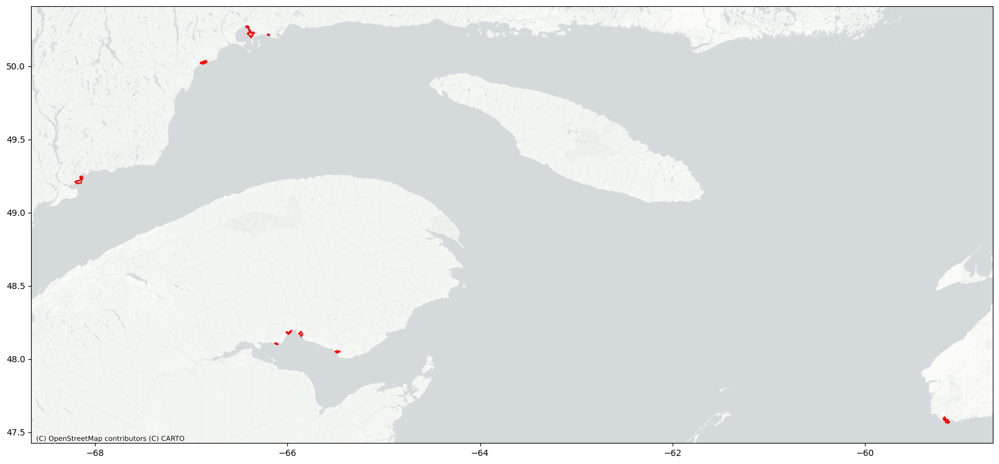

In [ ]:
###  Plot locations of population centers with percentile rank difference between TEMPO and TROPOMI > 0.5

fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(20,12))

atl_pc_shp[(atl_pc_shp['tempo_no2_percentile'] - atl_pc_shp['tropomi_no2_percentile']) > 0.5].plot(
    ax=ax,
    facecolor="none",
    edgecolor="red",
    linewidth=1.5,
    )

contextily.add_basemap(
        ax=ax,
        crs="epsg:4326",
        source=contextily.providers.CartoDB.PositronNoLabels,
        zoom=10
    )

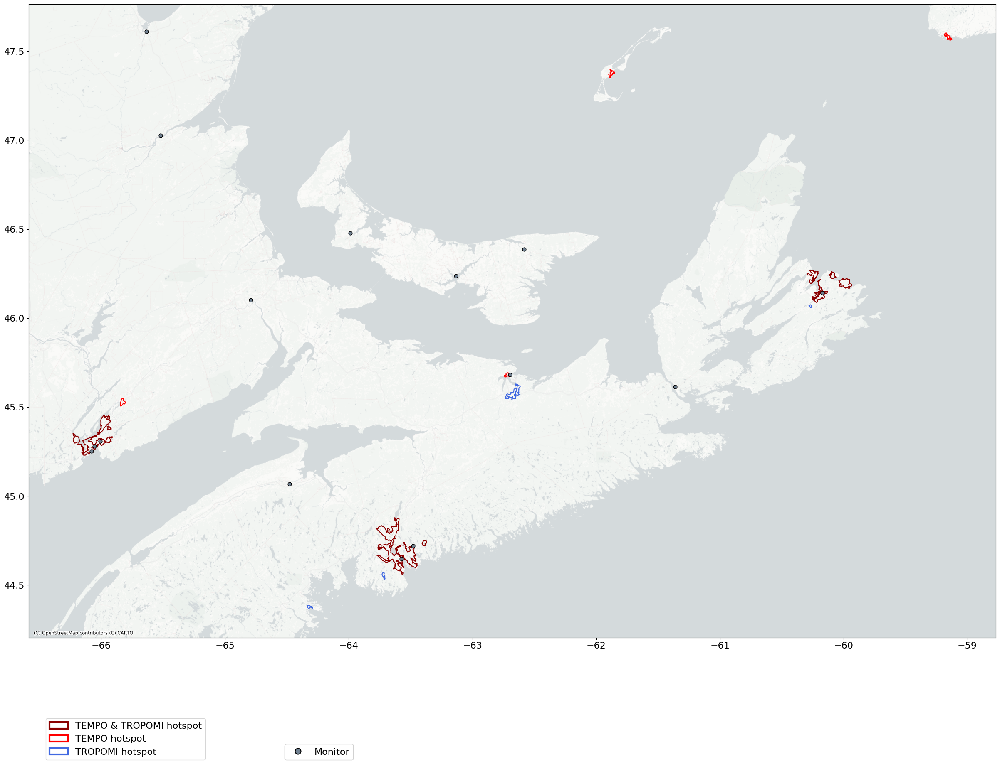

In [ ]:
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(30,20))

ax.tick_params(axis='both', which='major', labelsize=16)

try:
  atl_pc_shp[(atl_pc_shp['tempo_no2_hotspot'] == 1) & (atl_pc_shp['tropomi_no2_hotspot'] == 1)].plot(
      ax=ax,
      facecolor="none",
      edgecolor="darkred",
      linewidth=1.5,
      label="TEMPO & TROPOMI hotspot"
      )
except:
  pass

try:
  atl_pc_shp[(atl_pc_shp['tempo_no2_hotspot'] == 1) & (atl_pc_shp['tropomi_no2_hotspot'] == 0)].plot(
      ax=ax,
      facecolor="none",
      edgecolor="red",
      linewidth=1.5,
      label="TEMPO hotspot"
      )
except:
  pass

try:
  atl_pc_shp[(atl_pc_shp['tempo_no2_hotspot'] == 0) & (atl_pc_shp['tropomi_no2_hotspot'] == 1)].plot(
      ax=ax,
      facecolor="none",
      edgecolor="royalblue",
      linewidth=1.5,
      label="TROPOMI hotspot"
      )
except:
  pass

contextily.add_basemap(
    ax=ax,
    crs="epsg:4326",
    source=contextily.providers.CartoDB.PositronNoLabels,
    zoom=10
    )

atl_stations.plot(
    ax = ax,
    facecolor="slategrey",
    edgecolor="black",
    markersize=40,
    label="Monitor"
)

## add legend
lines1 = [
    Patch(facecolor="none", linewidth=3, edgecolor=t.get_edgecolor())
    for t in ax.collections[0:-1]
]
labels1 = [t.get_label() for t in ax.collections[0:-1]]
legend1 = ax.legend(lines1, labels1, bbox_to_anchor=(0.1,-0.2), loc="lower center", prop={'size': 16})

lines2 = [
    Line2D([0], [0], linestyle="none", markeredgewidth=1.5, marker="o", markersize=10, markerfacecolor=t.get_facecolor(), markeredgecolor=t.get_edgecolor())
    for t in [ax.collections[-1]]
]
labels2 = [t.get_label() for t in [ax.collections[-1]]]
legend2 = ax.legend(lines2, labels2, bbox_to_anchor=(0.3,-0.2), loc="lower center", prop={'size': 16})

ax.add_artist(legend1)
ax.add_artist(legend2)

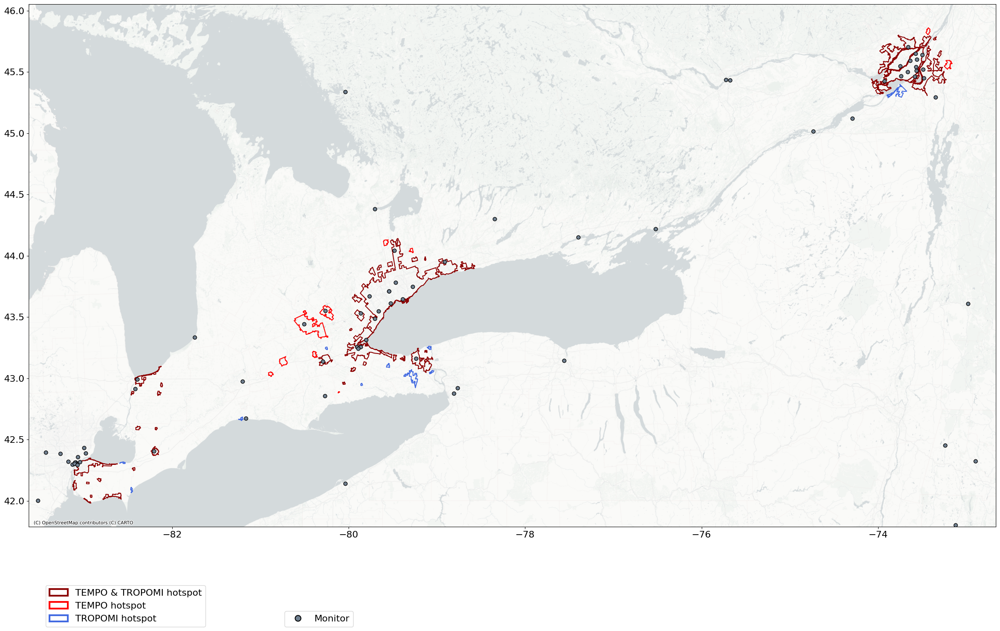

In [ ]:
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(30,20))

ax.tick_params(axis='both', which='major', labelsize=16)

try:
  qw_pc_shp[(qw_pc_shp['tempo_no2_hotspot'] == 1) & (qw_pc_shp['tropomi_no2_hotspot'] == 1)].plot(
      ax=ax,
      facecolor="none",
      edgecolor="darkred",
      linewidth=1.5,
      label="TEMPO & TROPOMI hotspot"
      )
except:
  pass

try:
  qw_pc_shp[(qw_pc_shp['tempo_no2_hotspot'] == 1) & (qw_pc_shp['tropomi_no2_hotspot'] == 0)].plot(
      ax=ax,
      facecolor="none",
      edgecolor="red",
      linewidth=1.5,
      label="TEMPO hotspot"
      )
except:
  pass

try:
  qw_pc_shp[(qw_pc_shp['tempo_no2_hotspot'] == 0) & (qw_pc_shp['tropomi_no2_hotspot'] == 1)].plot(
      ax=ax,
      facecolor="none",
      edgecolor="royalblue",
      linewidth=1.5,
      label="TROPOMI hotspot"
      )
except:
  pass

contextily.add_basemap(
    ax=ax,
    crs="epsg:4326",
    source=contextily.providers.CartoDB.PositronNoLabels,
    zoom=10
    )

qw_stations.plot(
    ax = ax,
    facecolor="slategrey",
    edgecolor="black",
    markersize=40,
    label="Monitor"
)

## add legend
lines1 = [
    Patch(facecolor="none", linewidth=3, edgecolor=t.get_edgecolor())
    for t in ax.collections[0:-1]
]
labels1 = [t.get_label() for t in ax.collections[0:-1]]
legend1 = ax.legend(lines1, labels1, bbox_to_anchor=(0.1,-0.2), loc="lower center", prop={'size': 16})

ax.add_artist(legend1)

lines2 = [
    Line2D([0], [0], linestyle="none", markeredgewidth=1.5, marker="o", markersize=10, markerfacecolor=t.get_facecolor(), markeredgecolor=t.get_edgecolor())
    for t in [ax.collections[-1]]
]
labels2 = [t.get_label() for t in [ax.collections[-1]]]
ax.legend(lines2, labels2, bbox_to_anchor=(0.3,-0.2), loc="lower center", prop={'size': 16})

#### **2) Local-level (selected municipalities) Monitoring Gaps:**

In [ ]:
###  Combination

needed = []
monitored = []


for city in ["Halifax", "Saint John", "Québec", "Cape Breton - Sydney", "Montréal", "Toronto", "Sarnia", "Windsor"]:

    if city in ["Halifax", "Saint John", "Cape Breton - Sydney"]:

        subset_tempo_xr = city_subset(city, no2_annual_atl_xr)
        subset_tropomi_xr = city_subset(city, no2_annual_tropomi_atl_xr)

    else:

        subset_tempo_xr = city_subset(city, no2_annual_qw_xr)
        subset_tropomi_xr = city_subset(city, no2_annual_tropomi_qw_xr)

    subset_tropomi_xr = subset_tropomi_xr.interpolate_na(dim="x")[["y", "x", "observation"]]

    subset_tempo_gdf = city_convert_gdf(city, subset_tempo_xr)
    subset_tropomi_gdf = city_convert_gdf(city, subset_tropomi_xr)

    subset_tempo_gdf.columns = ["id","geometry","lon","lat","y","x","tempo_no2","spatial_ref"]
    subset_tropomi_gdf.columns = ["id","geometry","lon","lat","y","x","tropomi_no2","spatial_ref"]

    subset_gdf = subset_tempo_gdf.merge(
        subset_tropomi_gdf, on=["id","geometry","lon","lat","y","x","spatial_ref"], how="inner"
        )

    subset_gdf['tempo_no2_percentile'] = subset_gdf['tempo_no2'].rank(pct=True)
    subset_gdf['tropomi_no2_percentile'] = subset_gdf['tropomi_no2'].rank(pct=True)

    subset_gdf['centroid'] = subset_gdf.geometry.centroid
    subset_gdf['Extent'] = city

    bound_stations = stations[(stations['Longitude'] >= np.min(pc_grids_coords[city].lon)) &
                              (stations['Longitude'] <= np.max(pc_grids_coords[city].lon)) &
                              (stations['Latitude'] >= np.min(pc_grids_coords[city].lat)) &
                              (stations['Latitude'] <= np.max(pc_grids_coords[city].lat))].reset_index(drop=True)

    bound_stations['Extent'] = city

    tempo_val_extract = []
    tropomi_val_extract = []

    for s in range(bound_stations.shape[0]):

        x_coord = bound_stations.Longitude.iloc[s]
        y_coord = bound_stations.Latitude.iloc[s]
        tempo_val = subset_tempo_xr.interp({'x':x_coord, 'y':y_coord}, method='linear').observation.values.tolist()
        tropomi_val = subset_tropomi_xr.interp({'x':x_coord, 'y':y_coord}, method='linear').observation.values.tolist()

        tempo_val_extract.append(tempo_val)
        tropomi_val_extract.append(tropomi_val)

    bound_stations['TEMPO'] = pd.Series(tempo_val_extract)
    bound_stations['TROPOMI'] = pd.Series(tropomi_val_extract)

    bound_stations['TEMPO_quotient_100'] = bound_stations['TEMPO'] / np.nanmax(subset_tempo_xr.observation.values)
    bound_stations['TEMPO_quotient_98'] = bound_stations['TEMPO'] / np.nanpercentile(subset_tempo_xr.observation.values, 98)
    bound_stations['TEMPO_quotient_95'] = bound_stations['TEMPO'] / np.nanpercentile(subset_tempo_xr.observation.values, 95)
    bound_stations['TEMPO_quotient_90'] = bound_stations['TEMPO'] / np.nanpercentile(subset_tempo_xr.observation.values, 90)

    bound_stations['TROPOMI_quotient_100'] = bound_stations['TROPOMI'] / np.nanmax(subset_tropomi_xr.observation.values)
    bound_stations['TROPOMI_quotient_98'] = bound_stations['TROPOMI'] / np.nanpercentile(subset_tropomi_xr.observation.values, 98)
    bound_stations['TROPOMI_quotient_95'] = bound_stations['TROPOMI'] / np.nanpercentile(subset_tropomi_xr.observation.values, 95)
    bound_stations['TROPOMI_quotient_90'] = bound_stations['TROPOMI'] / np.nanpercentile(subset_tropomi_xr.observation.values, 90)

    subset_gdf = subset_gdf[(subset_gdf["tempo_no2_percentile"] > 0.90) | (subset_gdf["tropomi_no2_percentile"] > 0.90)].reset_index(drop=True)

    dist_list = []
    station_list = []
    for n in range(subset_gdf.shape[0]):
        dist_list.append(np.min(subset_gdf.iloc[n].centroid.distance(bound_stations.geometry)))
        station_list.append(bound_stations['NAPS ID'].iloc[
            np.argmin(subset_gdf.iloc[n].centroid.distance(bound_stations.geometry))
            ])

    subset_gdf['nearest_monitor_dist_km'] = pd.Series(dist_list) * 111
    subset_gdf['nearest_monitor_id'] = pd.Series(station_list)
    subset_gdf = subset_gdf.drop(['centroid'], axis=1)

    monitored.append(bound_stations)
    needed.append(subset_gdf)


monitored = pd.concat(monitored).reset_index(drop=True)
needed = pd.concat(needed).reset_index(drop=True)

In [ ]:
needed = needed.merge(
    monitored[["NAPS ID",
               "TEMPO_quotient_100","TEMPO_quotient_98","TEMPO_quotient_95","TEMPO_quotient_90",
               "TROPOMI_quotient_100","TROPOMI_quotient_98","TROPOMI_quotient_95","TROPOMI_quotient_90"]],
    how="left", left_on=["nearest_monitor_id"], right_on=["NAPS ID"]
)

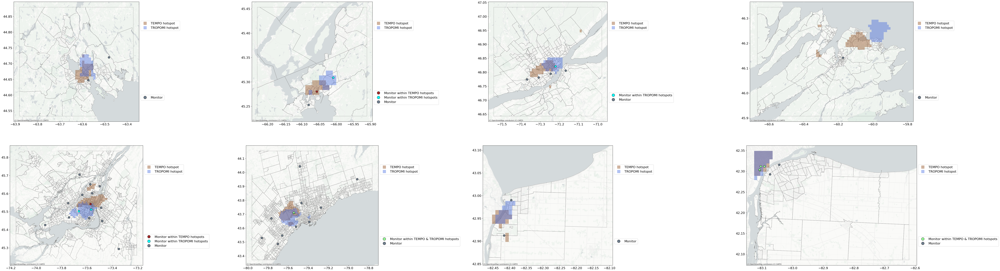

In [ ]:
fig = plt.figure(figsize=(20*3 + 30, 12*2))
gspec = gridspec.GridSpec(nrows=2, ncols=4, width_ratios=[0.5, 0.5, 0.5, 0.75], height_ratios=[1, 1])

plot_order = ["Halifax", "Saint John", "Québec", "Cape Breton - Sydney",
              "Montréal", "Toronto", "Sarnia", "Windsor"]


plot_xr = fetch_plot_Xr(no2_annual_atl, coord_atl_gdf)
plot_xr_qw = fetch_plot_Xr(no2_annual_qw, coord_qw_gdf)


for c in range(len(plot_order)):

    city = plot_order[c]
    ax = plt.subplot(gspec[c])

    ax.tick_params(axis='both', which='major', labelsize=16)

    plot_df_tempo = needed[(needed["Extent"] == city) &
                           (needed["tempo_no2_percentile"] >= 0.98)
                           ]

    plot_df_tropomi = needed[(needed["Extent"] == city) &
                             ((needed["tropomi_no2_percentile"] >= 0.98))
                            ]

    if city != "Cape Breton - Sydney" and city in ["Halifax", "Saint John"]:

        subset_plot_xr = city_subset(city, plot_xr)
        subset_plot_xr = city_convert_gdf(city, subset_plot_xr)

        intersect_cts[city].plot(ax=ax, facecolor="none", edgecolor="dimgrey", linewidth=0.5)

    elif city != "Cape Breton - Sydney" and city in ["Québec", "Montréal", "Toronto", "Sarnia", "Windsor"]:

        subset_plot_xr = city_subset(city, plot_xr_qw)
        subset_plot_xr = city_convert_gdf(city, subset_plot_xr)

        intersect_cts[city].plot(ax=ax, facecolor="none", edgecolor="dimgrey", linewidth=0.5)

    else:

        subset_plot_xr = city_subset(city, plot_xr)
        subset_plot_xr = city_convert_gdf(city, subset_plot_xr)

        intersect_das[city].plot(ax=ax, facecolor="none", edgecolor="dimgrey", linewidth=0.5)


    bound_stations = stations[(stations['Longitude'] >= np.min(subset_plot_xr.x.values)) &
                              (stations['Longitude'] <= np.max(subset_plot_xr.x.values)) &
                              (stations['Latitude'] >= np.min(subset_plot_xr.y.values)) &
                              (stations['Latitude'] <= np.max(subset_plot_xr.y.values))]

    bound_stations = bound_stations.merge(
        monitored[["NAPS ID",
                   "TEMPO_quotient_100","TEMPO_quotient_98","TEMPO_quotient_95","TEMPO_quotient_90",
                   "TROPOMI_quotient_100","TROPOMI_quotient_98","TROPOMI_quotient_95","TROPOMI_quotient_90"]],
        how="left", on=["NAPS ID"]
    )


    attainment = bound_stations[(bound_stations["TEMPO_quotient_98"] >= 1.0) & (bound_stations["TROPOMI_quotient_98"] >= 1.0)]
    tempo_attainment = bound_stations[(bound_stations["TEMPO_quotient_98"] >= 1.0) & (~(bound_stations["TROPOMI_quotient_98"] >= 1.0))]
    tropomi_attainment = bound_stations[(~(bound_stations["TEMPO_quotient_98"] >= 1.0)) & (bound_stations["TROPOMI_quotient_98"] >= 1.0)]
    nonattainment = bound_stations[(~(bound_stations["TEMPO_quotient_98"] >= 1.0)) & (~(bound_stations["TROPOMI_quotient_98"] >= 1.0))]


    contextily.add_basemap(
        ax=ax,
        crs="epsg:4326",
        source=contextily.providers.CartoDB.PositronNoLabels,
        zoom=12
    )

    plot_df_tempo.plot(
        ax=ax,
        facecolor="saddlebrown",
        edgecolor="saddlebrown",
        alpha=0.4,
        linewidth=0,
        aspect=None,
        label="TEMPO hotspot",
    )

    plot_df_tropomi.plot(
        ax=ax,
        facecolor="royalblue",
        edgecolor="royalblue",
        alpha=0.4,
        linewidth=0,
        aspect=None,
        label="TROPOMI hotspot",
    )

    if attainment.shape[0] > 0:

        attainment.plot(
            ax = ax,
            color="palegreen",
            markersize=100,
            edgecolor='black',
            linewidth=1,
            label="Monitor within TEMPO & TROPOMI hotspots",
        )

    if tempo_attainment.shape[0] > 0:

        tempo_attainment.plot(
            ax = ax,
            color="brown",
            markersize=100,
            edgecolor='black',
            linewidth=1,
            label="Monitor within TEMPO hotspots",
        )

    if tropomi_attainment.shape[0] > 0:

        tropomi_attainment.plot(
            ax = ax,
            color="cyan",
            markersize=100,
            edgecolor='black',
            linewidth=1,
            label="Monitor within TROPOMI hotspots",
        )

    if nonattainment.shape[0] > 0:

        nonattainment.plot(
            ax = ax,
            color="slategrey",
            markersize=100,
            edgecolor='black',
            linewidth=1,
            label="Monitor",
        )


    if max([len(t.get_label()) for t in ax.collections[1:3]]) > max([len(t.get_label()) for t in ax.collections[3:]]):
        first_legend_items = ax.collections[3:]
        second_legend_items = ax.collections[1:3]
        first_legend_pos = 0.2
        second_legend_pos = 0.8
        first_legend_marker = "o"
        second_legend_marker = "s"
    else:
        first_legend_items = ax.collections[1:3]
        second_legend_items = ax.collections[3:]
        first_legend_pos = 0.8
        second_legend_pos = 0.2
        first_legend_marker = "s"
        second_legend_marker = "o"

    lines = [
        Line2D([0], [0], linestyle="none", marker=first_legend_marker, markersize=14, markerfacecolor=t.get_facecolor(), markeredgecolor=t.get_edgecolor())
        for t in first_legend_items
    ]
    labels = [t.get_label() for t in first_legend_items]
    smaller_legend = ax.legend(lines, labels, bbox_to_anchor=(1.0, first_legend_pos), loc="center left", prop={'size': 16})

    ax.add_artist(smaller_legend)

    lines = [
        Line2D([0], [0], linestyle="none", marker=second_legend_marker, markersize=14, markerfacecolor=t.get_facecolor(), markeredgecolor=t.get_edgecolor())
        for t in second_legend_items
    ]
    labels = [t.get_label() for t in second_legend_items]
    ax.legend(lines, labels, bbox_to_anchor=(1.0, second_legend_pos), loc="center left", prop={'size': 16})